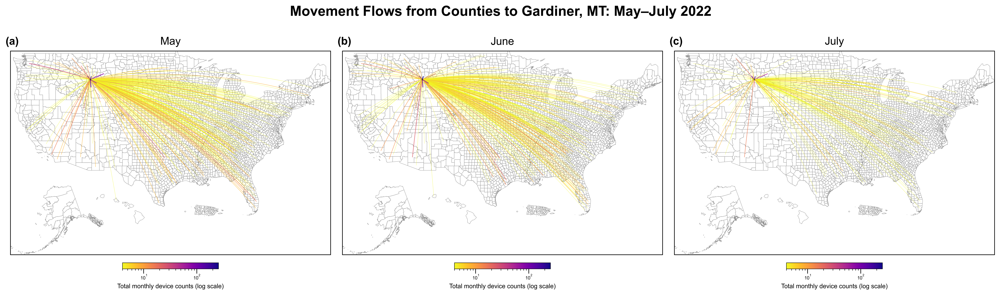

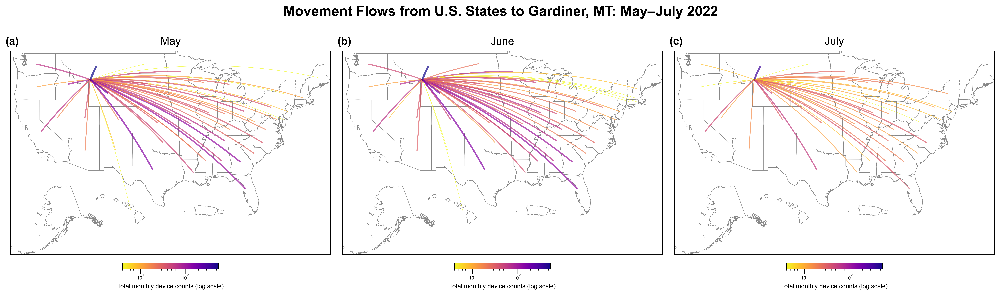

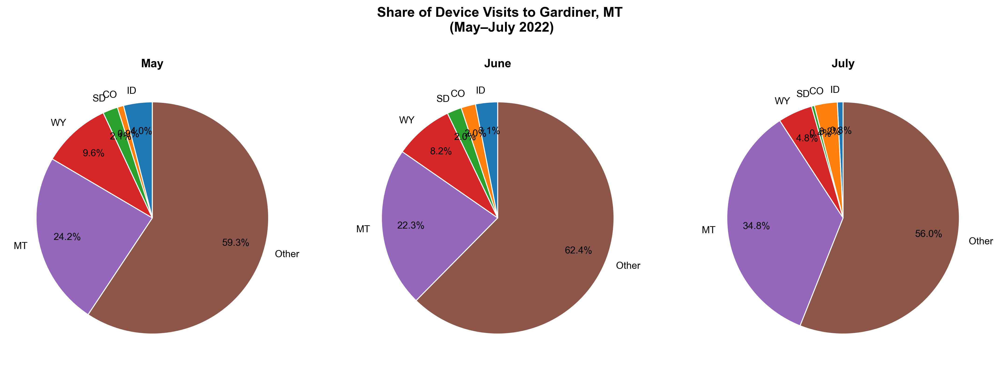

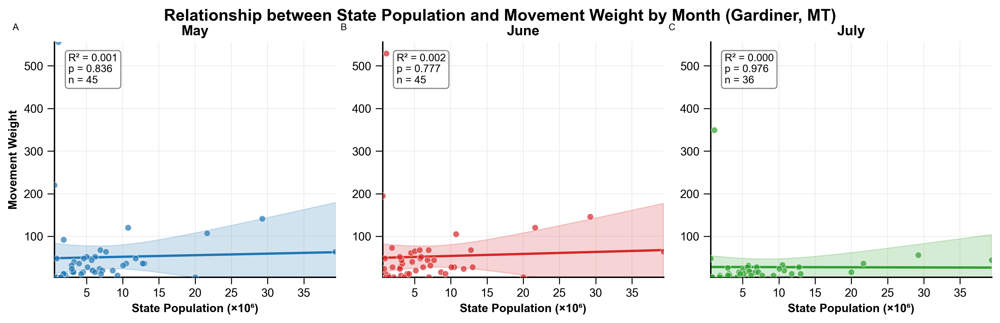

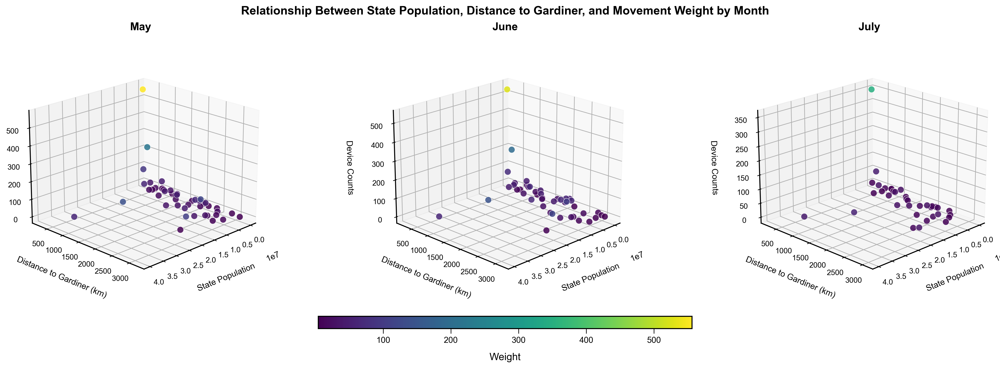

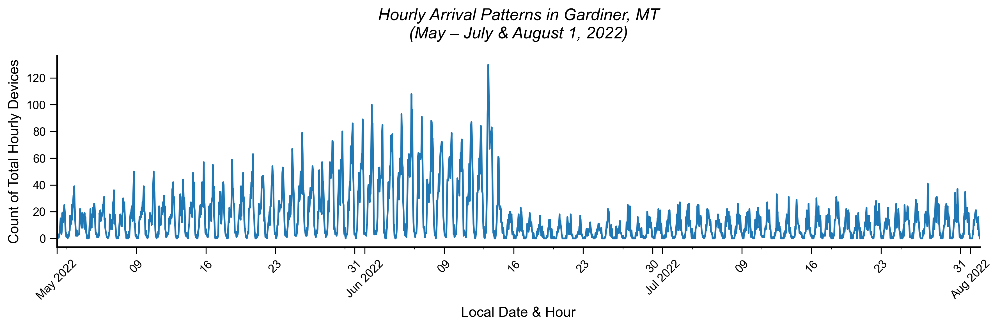

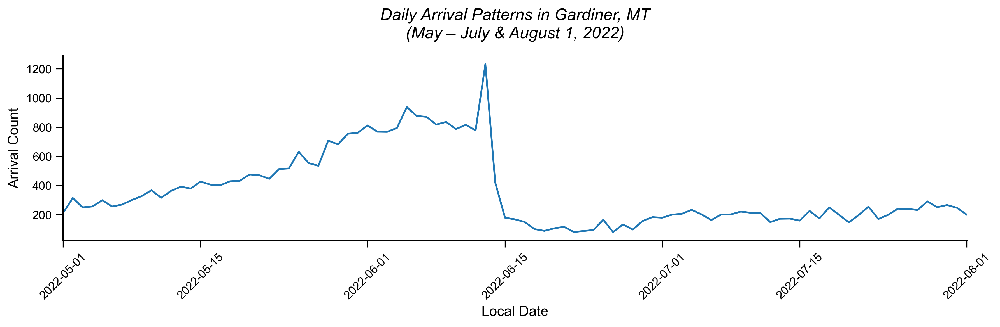

<Figure size 1920x1440 with 0 Axes>

<Figure size 1920x1440 with 0 Axes>

<Figure size 1920x1440 with 0 Axes>

<Figure size 1920x1440 with 0 Axes>

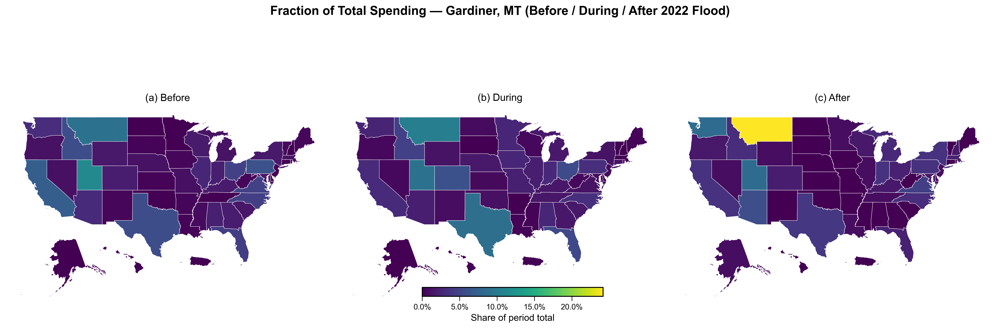

In [1]:
import sys
import geopandas as gpd
sys.path.append(r"F:\Yellow Stone Flood-2022\floodanalysis\Scripts")
import mo as mb 
import matplotlib.pyplot as plt

# Load both Wyoming and Montana CBGs
wy_mt_cbg = mb.load_blockgroups([mb.SHAPEFILE_WY_CBG, mb.SHAPEFILE_MT_CBG])

# Load both Wyoming and Montana mobility data
df_2022 = mb.load_advan([mb.ADVAN_CSV_WY, mb.ADVAN_CSV_MT], year=2022)

# Load State Population data
gdf_proj_states = mb.load_state_pop(mb.STATE_POP_FILE)

# Run pipeline for West Yellowstone, Montana

results = mb.run_full_pipeline_for_place(
    place_name="Gardiner, Montana, USA",
    pretty_label="Gardiner, MT",
    geoid_prefixes=["30067"],  
    wy_cbg=wy_mt_cbg,
    df_2022=df_2022,
    gdf_proj_states=gdf_proj_states,
    exclude_geoids=['300670005002', '300679806001'],
    outdir="temp"  
)
# Hourly arrivals
hourly_fig, _ = mb.plot_hourly_series(results["hourly_series"], "Gardiner, MT")
plt.show()

# Daily arrivals
daily_fig, _ = mb.plot_daily_series(results["daily_series"], "Gardiner, MT")
plt.show()

# County flow maps
results["figs"]["county_flow"]  
plt.show()  

# State flow maps
plt.figure(results["figs"]["state_flow"].number)  
plt.show()

# Pie chart visitor origins
plt.figure(results["figs"]["pie"].number)
plt.show()

# Regression panels
plt.figure(results["figs"]["regression"].number)
plt.show()

# 3D scatter plots
plt.figure(results["figs"]["scatter3d"].number)
plt.show()

# Interactive OD map 
results["od_map_example"]  

# Plotting the State of origin choropleth Mapping
us_states = gpd.read_file (mb.US_STATES_FILE).to_crs (epsg = 4326)
# Ensure proper format
us_states['STATEFP'] = us_states['STATEFP'].astype(str).str.zfill(2)
# Remove territories
drops = ['60', '66', '69', '78']
us_states= us_states [~us_states['STATEFP'].isin(drops)].copy()

# Analyze state origin for Cody
result_cody = mb.analyze_state_origin_for_place (
    csv_path =r'F:\Yellow Stone Flood-2022\floodanalysis\Data\CSV Origin\Gardiner_State_of_Origin.csv',
    us_states_gdf = us_states,
    place_label = 'Gardiner, MT',
    as_fraction = True,
    save_fig_path = 'temp/gardiner_origin.png'
)
plt.show()
